In [52]:
!pip install mediapipe==0.10.14

In [53]:
import mediapipe as mp
print(mp.__version__)


0.10.14


In [54]:
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import os

In [55]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

Uzyskiwanie danych:

In [56]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [57]:
data_dir = "/content/drive/MyDrive/images"
os.listdir(data_dir)


['serve', 'backhand', 'ready_position', 'forehand']

Inicjalizacja mediapipe

In [58]:
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(
    static_image_mode=False,
    model_complexity=1,
    enable_segmentation=False,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5
)

In [59]:
SELECT_LANDMARKS = [
    11, 12,  # barki
    13, 14,  # łokcie
    15, 16,  # nadgarstki
    23, 24,  # biodra
    25, 26,  # kolana
    27, 28   # kostki
]

funkcja ekstrakcji jedynie potrzebnych landmarków

In [60]:
def extract_simplified_landmarks(frame):
    """Zwraca wektor 48-elementowy: x,y,z,visibility dla wybranych punktów"""
    results = pose.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    if not results.pose_landmarks:
        return None  # brak detekcji

    lm = []
    for idx in SELECT_LANDMARKS:
        p = results.pose_landmarks.landmark[idx]
        lm.extend([p.x, p.y, p.z, p.visibility])
    lm = np.array(lm).reshape(len(SELECT_LANDMARKS), 4)

    # centrowanie względem środka bioder
    hip_center = lm[6:8, :2].mean(axis=0)  # index 6 i 7 = lewe i prawe biodro
    lm[:, :2] -= hip_center

    # skalowanie względem szerokości barków
    shoulder_distance = np.linalg.norm(lm[0, :2] - lm[1, :2])  # barki
    lm[:, :2] /= shoulder_distance + 1e-6  # uniknięcie dzielenia przez 0

    return lm.flatten()  # finalnie shape = (48,)

Dtataset dla Pytorcha

In [61]:
class PoseDataset(Dataset):
    def __init__(self, images_paths, labels):
        """
        images_paths: lista ścieżek do plików JPG/PNG
        labels: lista etykiet (int) odpowiadających klasom akcji
        """
        self.images_paths = images_paths
        self.labels = labels

    def __len__(self):
        return len(self.images_paths)

    def __getitem__(self, idx):
        img_path = self.images_paths[idx]
        label = self.labels[idx]

        # wczytaj obraz
        frame = cv2.imread(img_path)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # ekstrakcja landmarków
        lm = extract_simplified_landmarks(frame)
        if lm is None:
          lm = np.zeros(len(SELECT_LANDMARKS) * 4, dtype=np.float32)


        return torch.tensor(lm, dtype=torch.float32), torch.tensor(label, dtype=torch.long)


In [62]:
def load_dataset(dataset_dir, class_to_idx):
    images = []
    labels = []
    for cls_name, idx in class_to_idx.items():
        cls_folder = os.path.join(dataset_dir, cls_name)
        for file in os.listdir(cls_folder):
            if file.endswith((".jpg", ".png", ".jpeg")):
                images.append(os.path.join(cls_folder, file))
                labels.append(idx)
    return images, labels

In [63]:
class_to_idx = {"forehand":0, "backhand":1, "serve":2, "ready_position":3}
images, labels = load_dataset(data_dir, class_to_idx)

In [64]:
def filter_frames_with_landmarks(images_paths, labels):
    valid_imgs = []
    valid_labels = []

    for img_path, label in zip(images_paths, labels):
        frame = cv2.imread(img_path)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        lm = extract_simplified_landmarks(frame)
        if lm is not None and np.any(lm):
            valid_imgs.append(img_path)
            valid_labels.append(label)

    return valid_imgs, valid_labels


In [65]:
# 1. Load dataset
images, labels = load_dataset(data_dir, class_to_idx)

# 2. FILTER – USUWAMY frame’y bez landmarków
images, labels = filter_frames_with_landmarks(images, labels)

# 3. Split: train+val / test
trainval_imgs, test_imgs, trainval_labels, test_labels = train_test_split(
    images, labels, test_size=0.2, stratify=labels, random_state=42
)

# 4. Split: train / val
train_imgs, val_imgs, train_labels, val_labels = train_test_split(
    trainval_imgs, trainval_labels,
    test_size=0.2, stratify=trainval_labels, random_state=42
)

# 5. Dataset + DataLoader
train_dataset = PoseDataset(train_imgs, train_labels)
val_dataset = PoseDataset(val_imgs, val_labels)
test_dataset = PoseDataset(test_imgs, test_labels)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


Architektura MLP

In [66]:
class PoseMLP(nn.Module):
    def __init__(self, input_dim=48, hid_dim=128, num_classes=4):
        super().__init__()

        self.fc1 = nn.Linear(input_dim, hid_dim)
        self.fc2 = nn.Linear(hid_dim, hid_dim)

        self.act = nn.GELU()
        self.norm = nn.LayerNorm(hid_dim)
        self.drop = nn.Dropout(0.3)

        self.classifier = nn.Linear(hid_dim, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.norm(x)
        x = self.drop(x)

        x = self.fc2(x)
        x = self.act(x)

        return self.classifier(x)


Trening

In [67]:
model = PoseMLP(input_dim=48, hid_dim=128, num_classes=4).to(device)

In [68]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model.parameters(),
                             lr=0.001)

In [69]:
epochs = 10

for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    model.train()
    total_loss = 0
    for x, y in train_loader:
        x = x.to(device)
        y = y.to(device)

        optimizer.zero_grad()
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    train_loss = total_loss / len(train_loader)

    model.eval()
    val_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for x, y in val_loader:
            x = x.to(device)
            y = y.to(device)

            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            val_loss += loss.item()

            # dokładność
            predicted = torch.argmax(y_pred, dim=1)
            correct += (predicted == y).sum().item()
            total += y.size(0)

    val_loss /= len(val_loader)
    val_acc = correct / total

    print(f"Train Loss: {train_loss:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")


Epoch 1/10


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


Train Loss: 1.3183, Val Loss: 1.2239, Val Acc: 0.4676
Epoch 2/10
Train Loss: 1.1656, Val Loss: 1.1332, Val Acc: 0.4892
Epoch 3/10
Train Loss: 1.0322, Val Loss: 1.0764, Val Acc: 0.5324
Epoch 4/10
Train Loss: 1.0119, Val Loss: 1.0426, Val Acc: 0.5036
Epoch 5/10
Train Loss: 0.9647, Val Loss: 0.9938, Val Acc: 0.5468
Epoch 6/10
Train Loss: 0.9566, Val Loss: 1.0412, Val Acc: 0.4964
Epoch 7/10
Train Loss: 0.9380, Val Loss: 0.9973, Val Acc: 0.5324
Epoch 8/10
Train Loss: 0.9210, Val Loss: 0.9382, Val Acc: 0.5396
Epoch 9/10
Train Loss: 0.8528, Val Loss: 0.9548, Val Acc: 0.5540
Epoch 10/10
Train Loss: 0.8985, Val Loss: 0.9232, Val Acc: 0.5683


Jak wyglądają landamrki?

In [70]:
import matplotlib.pyplot as plt

def draw_selected_landmarks(image, results, selected_idxs):
    img = image.copy()

    if not results.pose_landmarks:
        return img

    h, w, _ = img.shape

    for idx in selected_idxs:
        lm = results.pose_landmarks.landmark[idx]
        cx, cy = int(lm.x * w), int(lm.y * h)
        cv2.circle(img, (cx, cy), 6, (0, 255, 0), -1)

    return img



=== FOREHAND ===


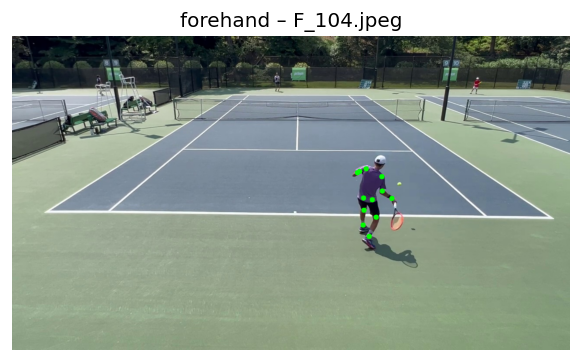

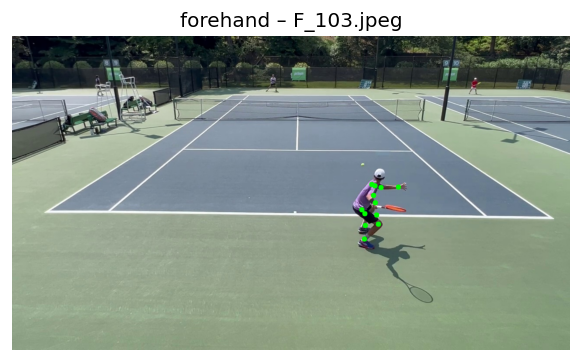

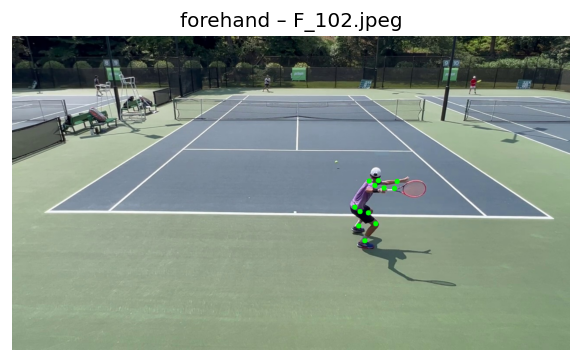

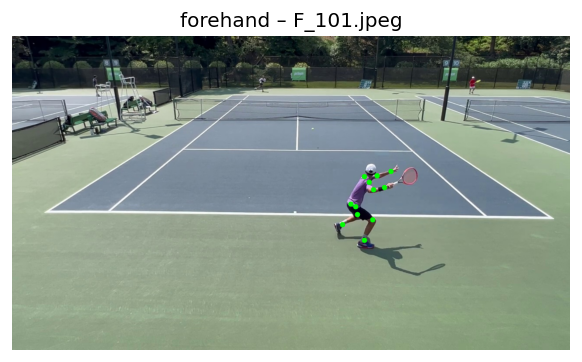

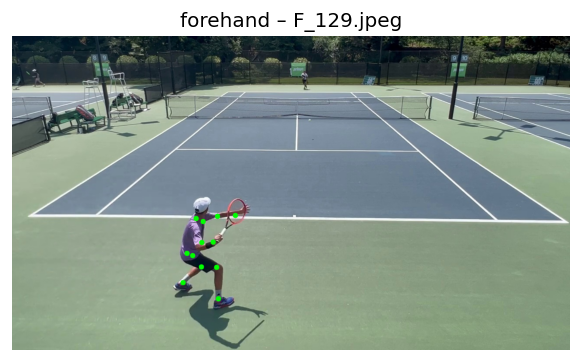

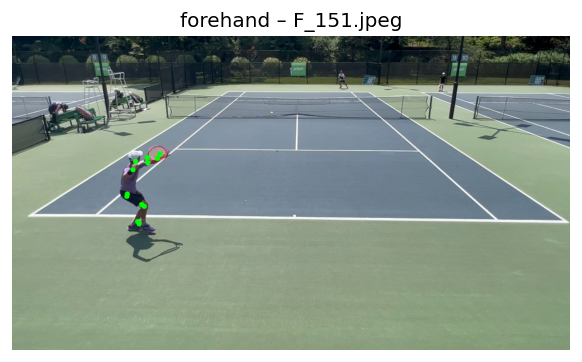

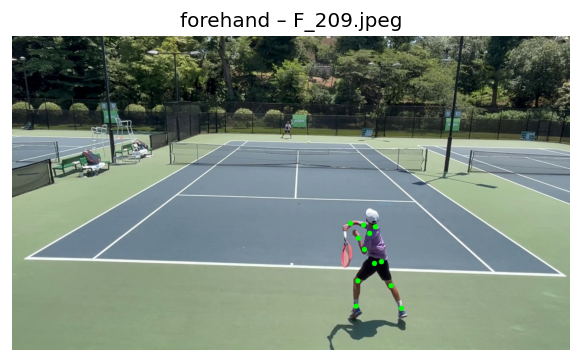

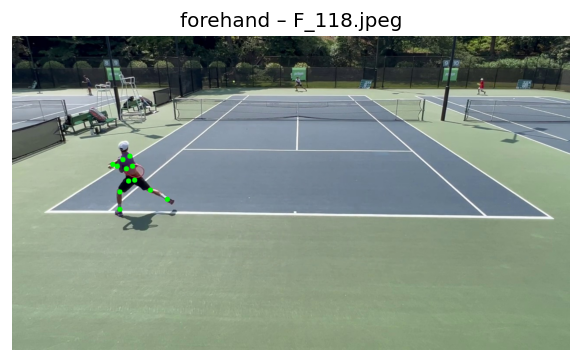

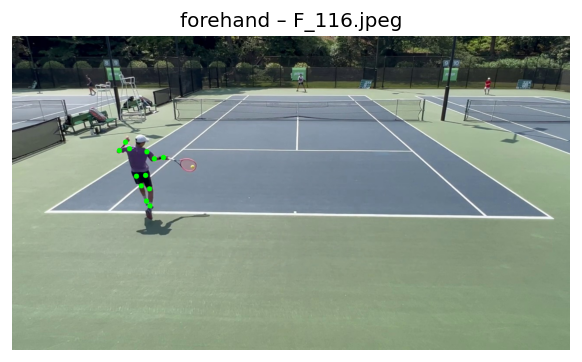

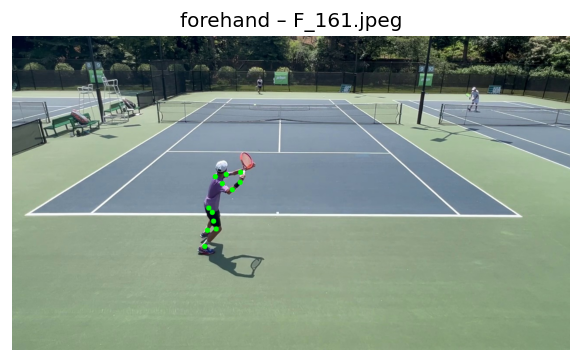


=== BACKHAND ===


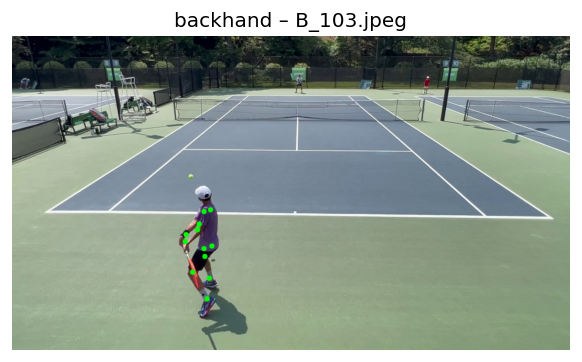

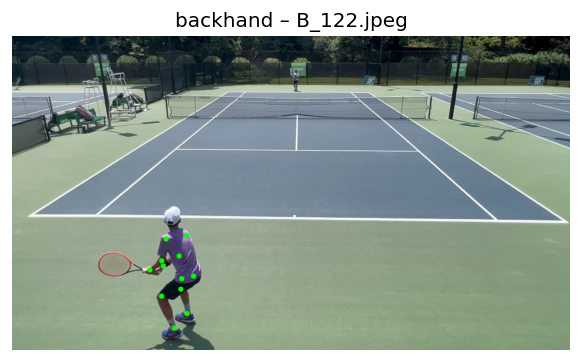

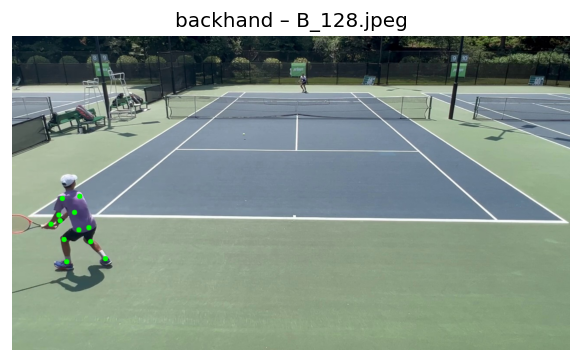

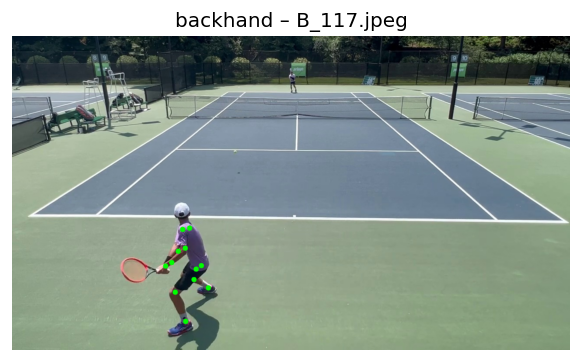

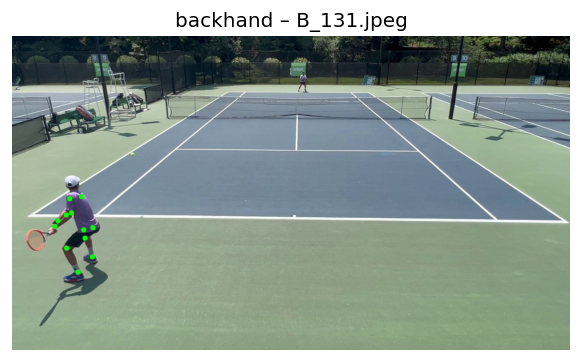

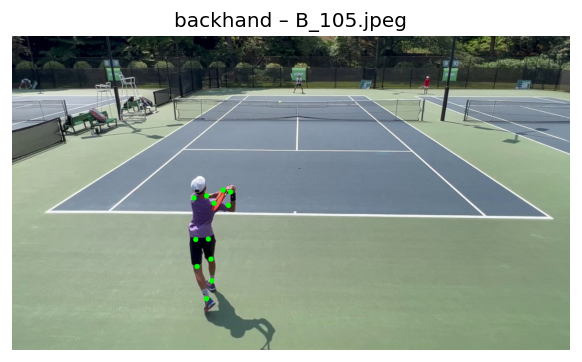

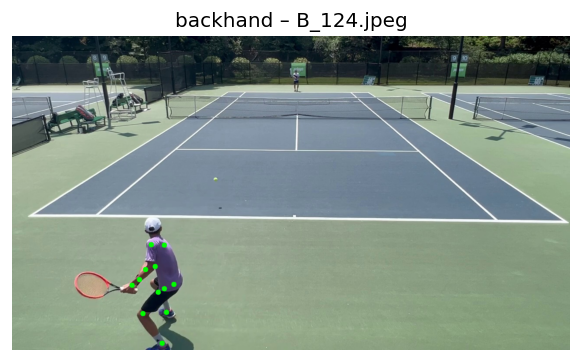

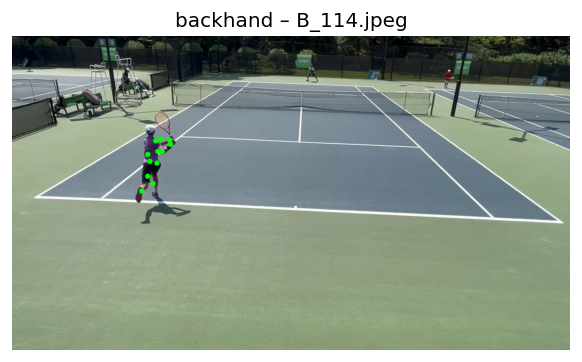

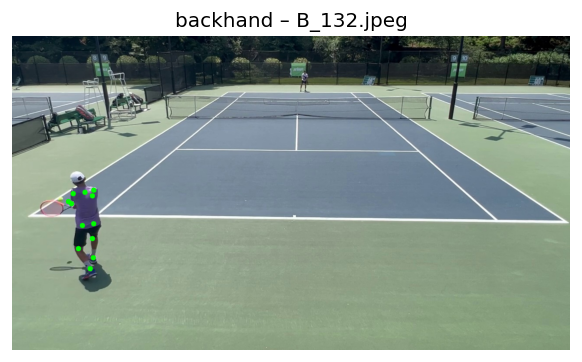

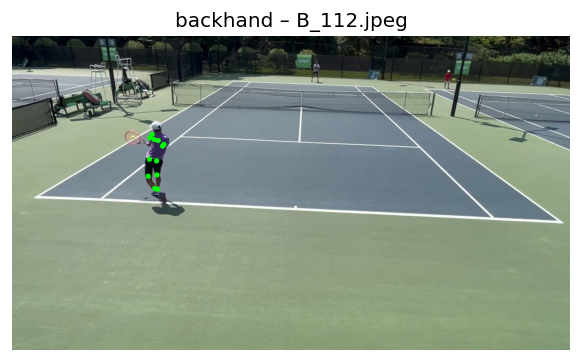


=== SERVE ===


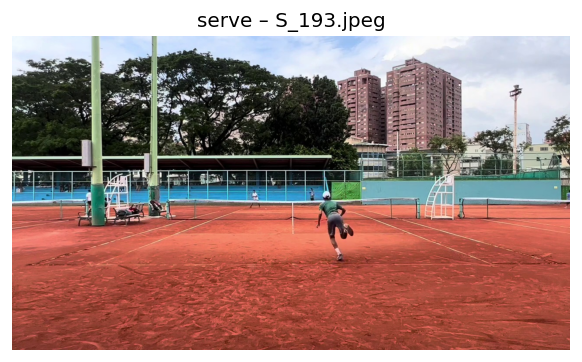

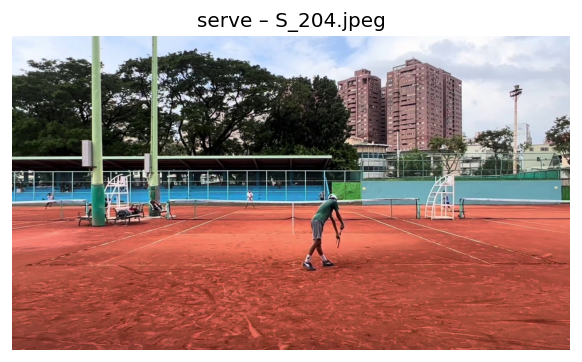

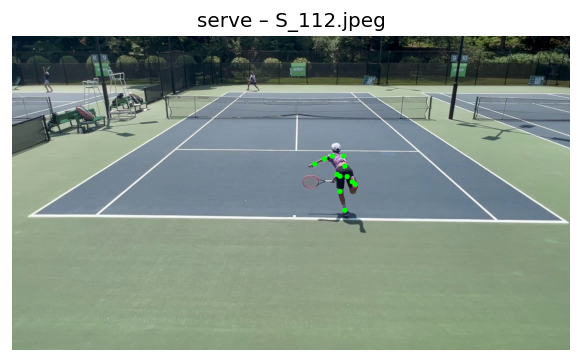

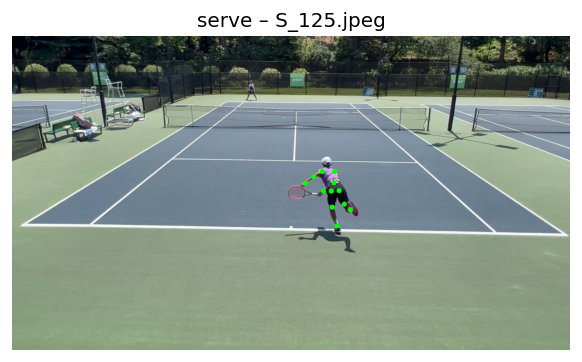

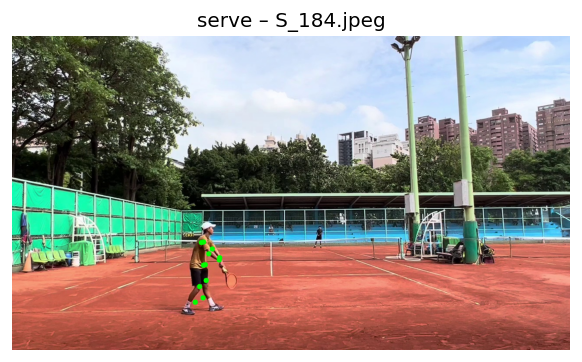

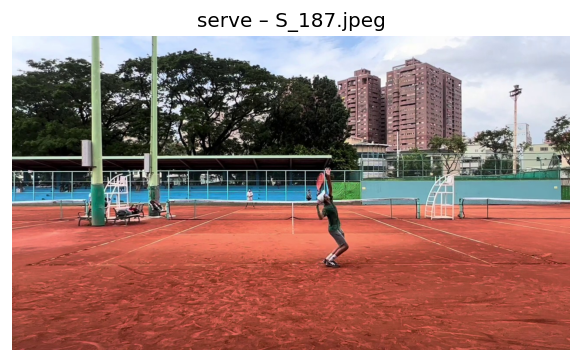

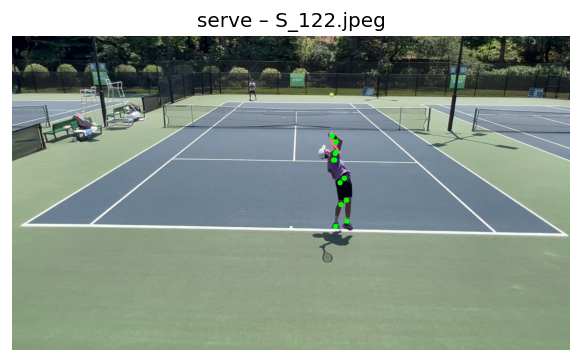

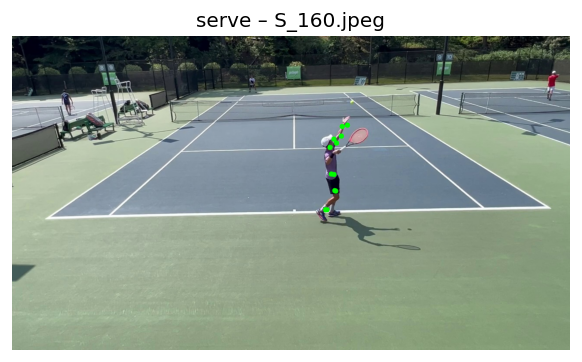

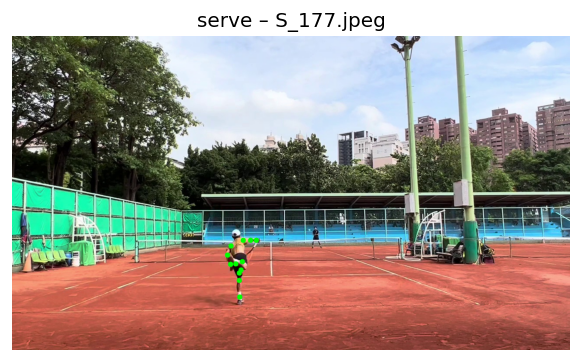

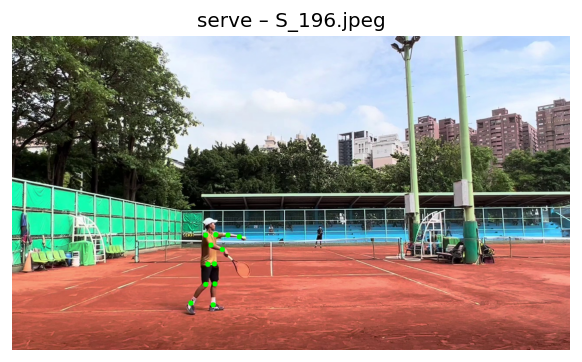


=== READY_POSITION ===


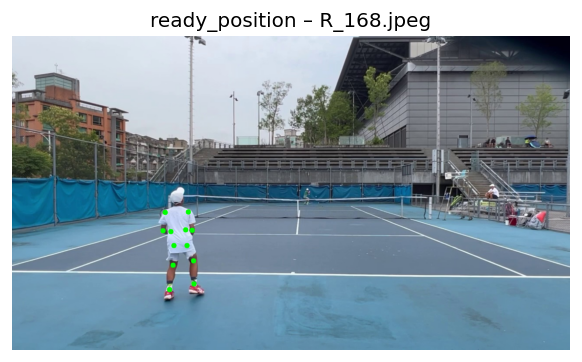

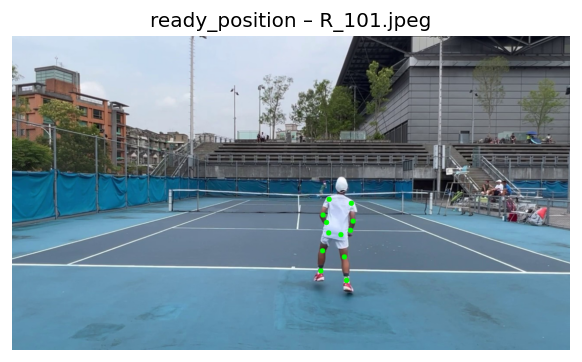

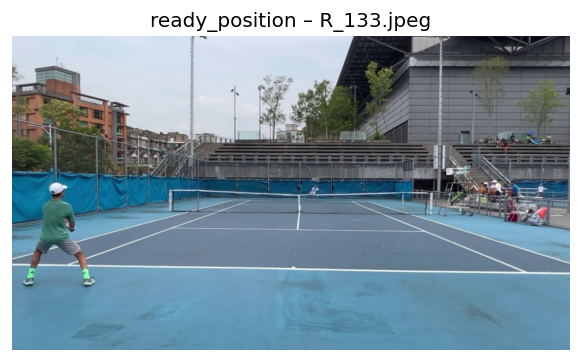

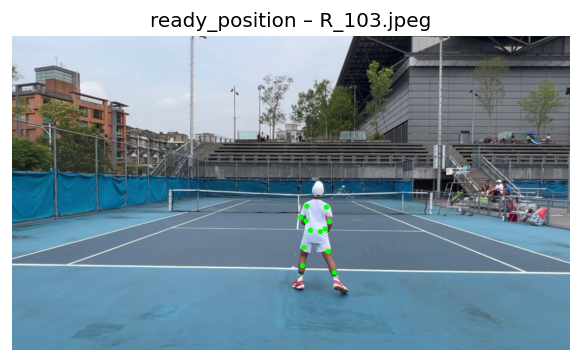

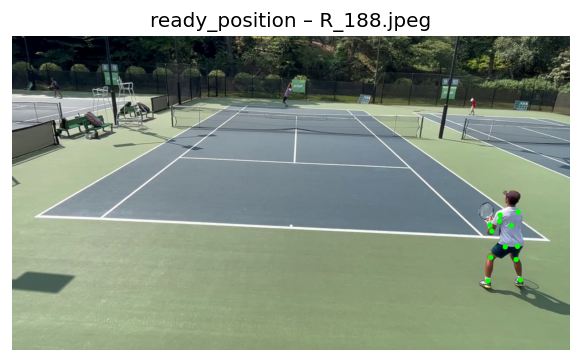

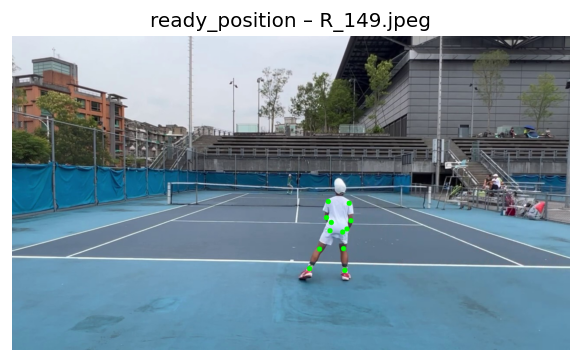

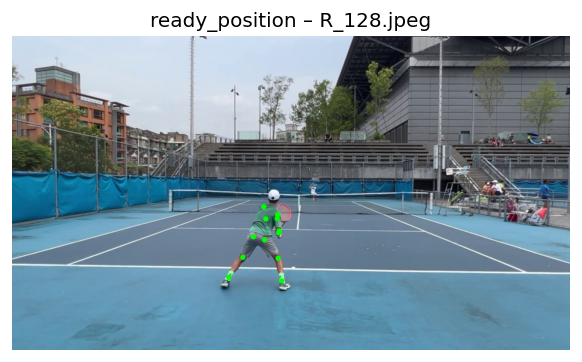

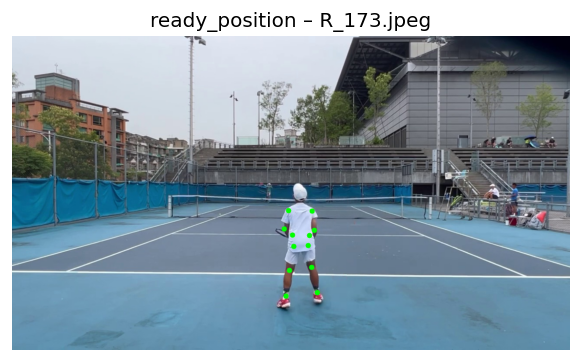

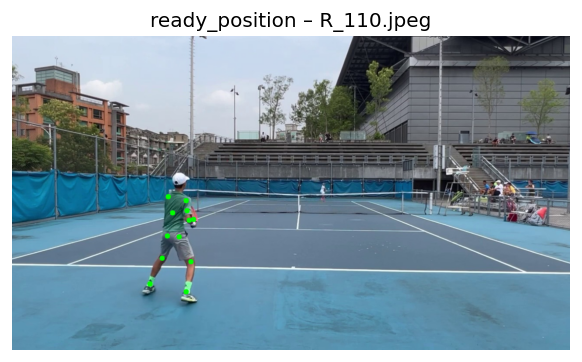

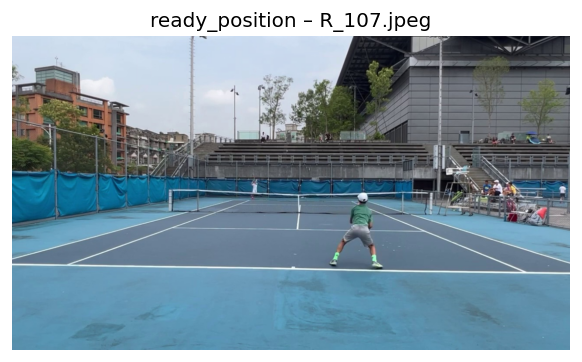

In [71]:
data_dir = "/content/drive/MyDrive/images"
classes = ["forehand", "backhand", "serve", "ready_position"]

mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True)

for cls in classes:
    cls_dir = os.path.join(data_dir, cls)
    files = [f for f in os.listdir(cls_dir)
             if f.lower().endswith((".jpg", ".jpeg", ".png"))][:10]

    print(f"\n=== {cls.upper()} ===")

    for file in files:
        img_path = os.path.join(cls_dir, file)
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        results = pose.process(img_rgb)
        vis_img = draw_selected_landmarks(img_rgb, results, SELECT_LANDMARKS)

        plt.figure(figsize=(6, 6), dpi=120)
        plt.imshow(vis_img)
        plt.title(f"{cls} – {file}", fontsize=12)
        plt.axis("off")
        plt.show()
